In [1]:
%matplotlib inline
import requests
import json
import pandas as pd
import matplotlib.pylab as plt
import numpy as np
import requests
import seaborn as sns

In [2]:
URL = "https://data.sfgov.org/resource/88g8-5mnd.json"

########## Some other data sources that may be interesting for the future. #############
#URL = "http://www.zillow.com/webservice/GetSearchResults.htm?" + "zws-id=" + "X1-ZWz1ezwkcmsft7_1651t" + \
#"&address=" + "san-francisco"
#URL = "https://api.data.gov/ed/collegescorecard/v1/schools/?sort=2011.earnings.6_yrs_after_entry.percent_greater_than_25000%3Adesc&school.operating=1&2013.student.size__range=0..&school.degrees_awarded.predominant=3&fields=id%2Cschool.name%2Cschool.city%2Cschool.state%2C2013.student.size%2Cschool.ownership%2Cschool.degrees_awarded.predominant%2C2013.cost.avg_net_price.overall%2C2013.completion.rate_suppressed.overall%2C2011.earnings.10_yrs_after_entry.median%2C2011.earnings.6_yrs_after_entry.percent_greater_than_25000%2Cschool.under_investigation&api_key=Xxf2NKtwfcXUd8K2hqawnlur6c0YY93xsNFwq0Dy"
#URL = "https://data.sfgov.org/resource/mjr8-p6m5.json"
#URL = "http://data.consumerfinance.gov/api/views/s6ew-h6mp.json"
#URL = "http://gis.ers.usda.gov/arcgis/rest/services/"
#URL = "http://api.data.gov/ed/collegescorecard/v1/schools"

In [3]:
response = requests.get(URL)
response.raise_for_status()
data = response.json()

In [4]:
df = pd.DataFrame.from_dict(data)

In [5]:
quantVar = ['health_dental','other_benefits','other_salaries','overtime','retirement','salaries','total_benefits','total_compensation','total_salary']
df[quantVar] = df[quantVar].astype(float)

df = df.sort_values(by='total_compensation')
df = df.reset_index()
df.head()

,index,department,department_code,employee_identifier,health_dental,job,job_code,job_family,job_family_code,organization_group,...,overtime,retirement,salaries,total_benefits,total_compensation,total_salary,union,union_code,year,year_type
0,1,Health Service System,HSS,2998,0.00,Deputy Sheriff,8304,Correction & Detention,8300,General Administration & Finance,...,0,0.00,0.00,0.00,27.68,27.68,Deputy Sheriffs' Association,498,2013,Fiscal
1,655,Public Health,DPH,26446,0.00,Special Nurse,P103,Nursing,2300,Community Health,...,0,7.87,33.96,10.82,48.18,37.36,"SEIU - Staff and Per Diem Nurses, Local 1021",791,2013,Fiscal
2,631,Recreation and Park Commission,REC,15420,0.00,Swimming Instructor,3209,Recreation,3200,Culture & Recreation,...,0,0.00,76.00,40.80,116.80,76.00,"SEIU - Miscellaneous, Local 1021",790,2013,Fiscal
3,966,District Attorney,DAT,17916,-3.85,Attorney (Civil/Criminal),8177,Legal & Court,8100,Public Protection,...,0,0.00,0.00,8.39,168.47,160.08,Municipal Attorneys' Association,311,2014,Calendar
4,378,General Services Agency - City Admin,ADM,47034,0.00,Public Service Trainee,9910,Public Service Aide,9900,General Administration & Finance,...,0,0.00,0.00,15.62,219.81,204.19,"SEIU - Miscellaneous, Local 1021",790,2013,Calendar


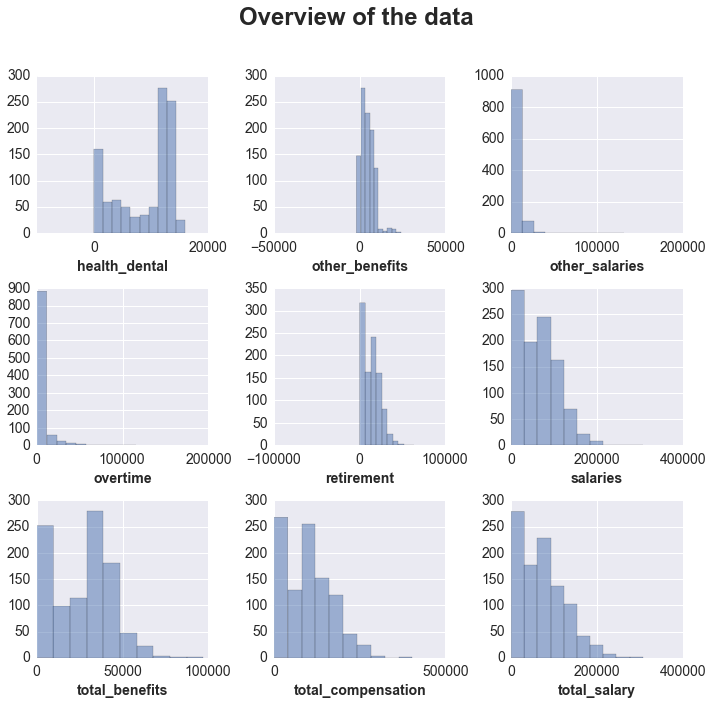

In [6]:
dList = range(9)
fig = plt.figure(figsize=(10,9), dpi=1600)
fig.suptitle('Overview of the data',fontsize=24,y=1.08,fontweight='bold')

#Function to make a single plot
def multiPlot(myData):    
    ax=plt.subplot2grid((ncol,nrow),(yPanel,xPanel))
    ax.hist(df[quantVar[myData]],alpha=0.5)
    ax.set_xlabel(quantVar[myData],fontsize=14,fontweight='bold')
    #ax.set_ylabel('Y',fontsize=14,fontweight='bold',rotation='Vertical')
    plt.locator_params(axis = 'x', nbins = 2)
    ax.tick_params(labelsize=14)

#Script to add plots to multipanel figure
xPanel = 0; yPanel = 0; ncol = 3; nrow = 3; legIdx=0
#plt.tight_layout()
for i in dList:
    multiPlot(i)
    xPanel=xPanel+1; legIdx=legIdx+1
    if xPanel>(nrow-1):
        xPanel=0
        yPanel=yPanel+1



fig.tight_layout()

In [7]:
quantVar

['health_dental',
 'other_benefits',
 'other_salaries',
 'overtime',
 'retirement',
 'salaries',
 'total_benefits',
 'total_compensation',
 'total_salary']

/Users/Peter/anaconda/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


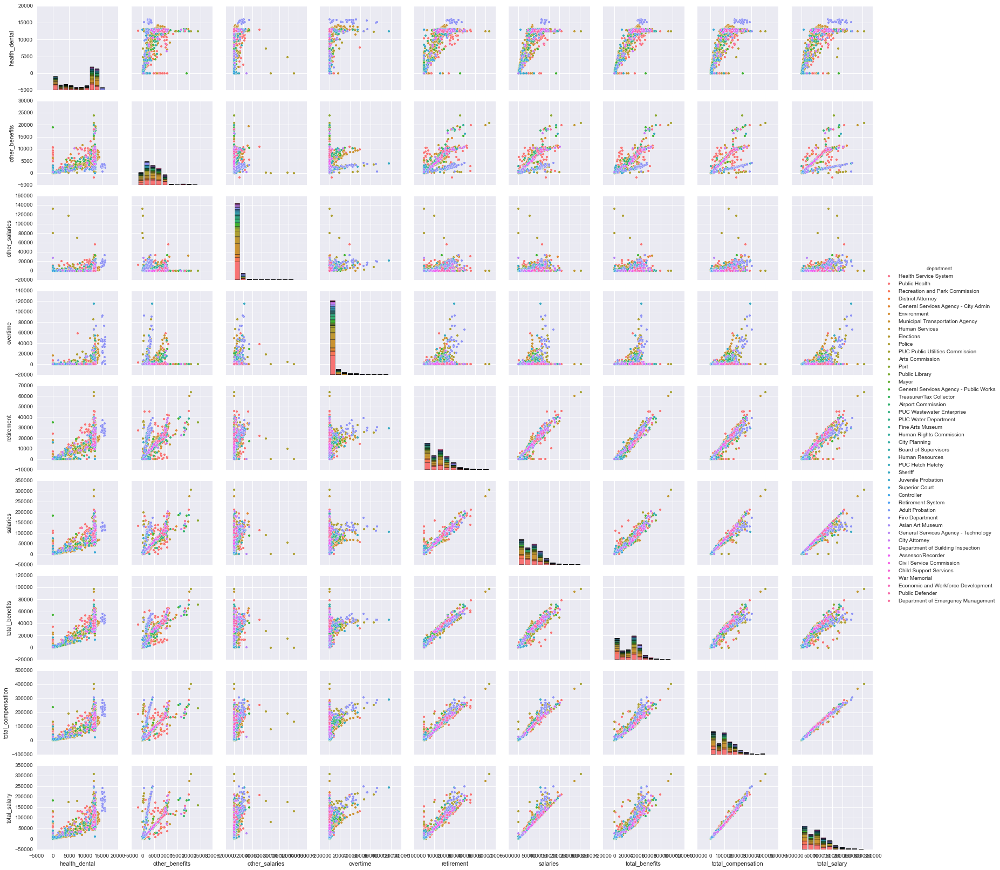

In [8]:
fig = plt.figure(figsize=(10,9), dpi=1600)
q2 = ['health_dental','other_benefits','other_salaries','overtime','retirement','salaries','total_benefits','total_compensation','total_salary','department']
#fig = plt.figure(figsize=(10,9), dpi=1600)
#ax = fig.add_subplot(111)
#pd.tools.plotting.scatter_matrix(df[quantVar],figsize=(22, 22),alpha=0.2)
sns.pairplot(df[q2],hue='department')

#plt.tight_layout()
plt.show()

In [9]:
df.loc[600]

index                                                          733
department                               PUC Wastewater Enterprise
department_code                                                CWP
employee_identifier                                          42645
health_dental                                              12752.5
job                                           Sewer Service Worker
job_code                                                      7449
job_family                                           Skilled Labor
job_family_code                                               7400
organization_group         Public Works, Transportation & Commerce
organization_group_code                                         02
other_benefits                                              6349.7
other_salaries                                                 760
overtime                                                       740
retirement                                                 144

$$Total Benefits = Health Dental + OtherBenefits + Retirement$$

$$Total Salary = Salaries + OtherSalaries + Overtime$$

$$Total Compensation = TotalBenefits + TotalSalary$$

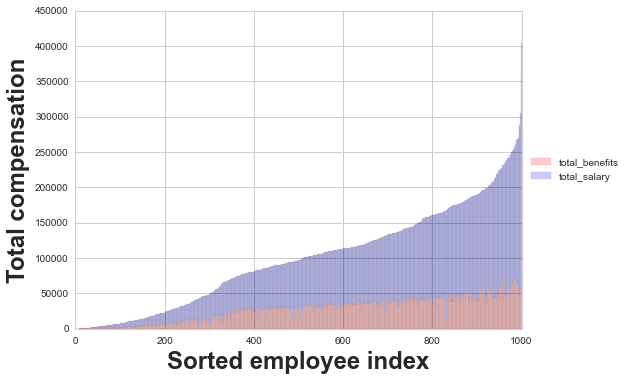

In [264]:
fig = plt.figure(figsize=(10,6), dpi=1600)
ax = plt.subplot(111)


annoIdx = set(['total_salary','total_benefits'])
colors = ['red','blue']
width = 1

condn = range(0,len(df.index))
rollBottom = np.repeat(0,len(condn)) #Create an index so the bars are stacked on top of each other
condnIdx = np.arange(len(condn))   # the x locations for the groups
colIdx = 0
for i in annoIdx:
    ax.bar(condnIdx, df[i], width, color=colors[colIdx],bottom=rollBottom,alpha=0.2,edgecolor = "none")
    rollBottom = rollBottom + list(df[i])
    colIdx = colIdx + 1
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height*0.95])
# Put a legend to the right of the current axis
ax.legend([i for i in annoIdx],loc='center left', bbox_to_anchor=(1, 0.5))

ax.set_xlabel('Sorted employee index',fontsize=24,fontweight='bold')
ax.set_ylabel('Total compensation',fontsize=24,fontweight='bold')
plt.show()

In [159]:
totComp = df['total_compensation']
t = range(len(totComp))

dfPol = df[df['department_code']=='REC']
dfFir = df[df['department_code']=='FIR']
dfMta = df[df['department_code']=='MTA']

polIdx = [i for i in np.where(df['department_code']=='REC')[0]]
firIdx = np.where(df['department_code']=='FIR')[0]
mtaIdx = np.where(df['department_code']=='MTA')[0]


In [160]:
#df.groupby(['department']).mean()
dpt = df.groupby(['department']).mean()
dpt = dpt.sort_values(by='total_compensation',ascending=False)[['total_compensation','total_salary','total_benefits']]  
dpt

,total_compensation,total_salary,total_benefits
department,,,
Fire Department,183089.072619,144852.795714,38236.276905
Department of Emergency Management,160132.540000,115357.356000,44775.184000
City Attorney,153338.729412,111533.314706,41805.414706
Public Defender,144979.870000,104715.940000,40263.930000
Department of Building Inspection,141886.313750,101566.727500,40319.586250
Economic and Workforce Development,140269.913333,98455.163333,41814.750000
Police,137996.272099,108289.303086,29706.969012
Sheriff,134327.026000,103448.583500,30878.442500
War Memorial,132450.550000,94442.225000,38008.325000


For the second Bokeh plot, I want to do some PCA on the data. The first step is to center the data. I'm scaling it to draw out the differences in data shape. Then calculate explained variance, etc

In [14]:
#[quantVar[i] for i in range(len(quantVar)) if quantVar[i] != 'total_compensation']
[quantVar[i] for i in range(len(quantVar)) if quantVar[i]  not in ['total_compensation','total_salary','total_benefits']] 

#'total_salary' in ['total_compensation','total_salary','total_benefits']

['health_dental',
 'other_benefits',
 'other_salaries',
 'overtime',
 'retirement',
 'salaries']

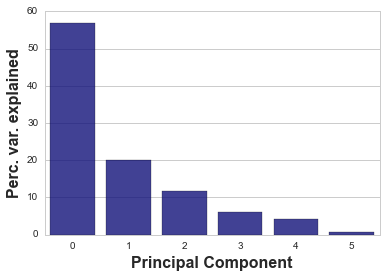

In [263]:
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA

fig = plt.figure(figsize=(6,4), dpi=1600)
ax = plt.subplot(111)

dfs = pd.DataFrame(scale(df[quantVar],with_std=True),columns=df[quantVar].columns)

dfResp = dfs['total_compensation']
#Remove as much collinearilty as possible
pred = [quantVar[i] for i in range(len(quantVar)) if quantVar[i]  not in ['total_compensation','total_salary','total_benefits']] 
dfPred = dfs[pred]

pca = PCA()
pca.fit(dfPred)

expVar = pca.explained_variance_ratio_
pca.explained_variance_ratio_
sns.barplot(x=np.arange(len(expVar)),y=expVar*100,alpha=0.8,color='darkblue')
ax.set_ylabel('Perc. var. explained',fontsize=16,fontweight='bold')
ax.set_xlabel('Principal Component',fontsize=16,fontweight='bold')
plt.show()

Project the data onto the principal components.

In [17]:
#New data in PC space
newData = pd.DataFrame(pca.transform(dfPred),columns=['PC' + str(i+1) for i in range(len(expVar))])

#Combine with original data to keep annotations, etc
newData = pd.concat([newData, df], axis=1)


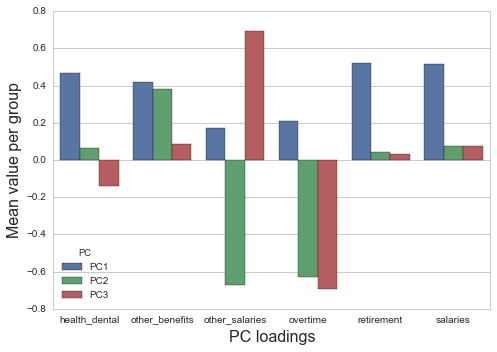

In [206]:
pcaLoad = pd.DataFrame(
    pca.components_,
    index = ['PC' + str(i+1) for i in range(len(expVar))],
    columns =  pred
    ).transpose()

fig = plt.figure(figsize=(7,5), dpi=1600)
ax = plt.subplot(111)

pcaLoad2 = pd.DataFrame(columns=['PC','values'])

#I think pandas 'melt' does an equivalent task...
p1 = pd.DataFrame({'values': pcaLoad.loc[:,'PC1'],'PC':'PC1'})
p2 = pd.DataFrame({'values': pcaLoad.loc[:,'PC2'],'PC':'PC2'})
p3 = pd.DataFrame({'values': pcaLoad.loc[:,'PC3'],'PC':'PC3'})
pcaLoad2 = pcaLoad2.append([p1,p2,p3])

pcaLoad2['loadings']=pcaLoad2.index

sns.barplot(x='loadings', y='values', hue='PC', data=pcaLoad2)
ax.set_xlabel('PC loadings', fontsize=16)
ax.set_ylabel('Mean value per group', fontsize=16)
plt.tight_layout()


Now, let's visualize the data using principal components.

In [291]:
def plotPCA(dpt1,dpt2,xVar,yVar,legLoc="bottom_left"):

    from bokeh.plotting import figure, output_file, show, ColumnDataSource, output_notebook
    from bokeh.models import HoverTool, Select

    output_notebook()
    
    nAll = newData    
    n1 = newData[newData['department_code']==dpt1]
    n2 = newData[newData['department_code']==dpt2]

    sAll = ColumnDataSource(
            data=dict(
                x = nAll[xVar],
                y = nAll[yVar],
                totSal = nAll['total_salary'],
                totCom = nAll['total_compensation'],
                dept = nAll['department'],
                totBen = nAll['total_benefits'],
                job = nAll['job']
            )
        )

    s1 = ColumnDataSource(
            data=dict(
                x = n1[xVar],
                y = n1[yVar],
                totSal = n1['total_salary'],
                totCom = n1['total_compensation'],
                dept = n1['department'],
                totBen = n1['total_benefits'],
                job = n1['job']
            )
        )

    s2 = ColumnDataSource(
            data=dict(
                x = n2[xVar],
                y = n2[yVar],
                totSal = n2['total_salary'],
                totCom = n2['total_compensation'],
                dept = n2['department'],
                totBen = n2['total_benefits'],
                job = n2['job']
            )
        )

    p = figure(plot_width=500, plot_height=400, tools="hover,pan,box_zoom,reset,save",
               title="PCA of SF employees", y_axis_label = yVar,
               x_axis_label = xVar)

    hover = p.select(dict(type=HoverTool))


    hover.tooltips = [
        ("Dept", "@dept"),
        ("Job", "@job"),
        ("Tot comp ($)", "@totCom"),
        ("Tot sal ($)", "@totSal"),
        ("Tot bnft ($)","@totBen")
    ]

    p.circle('x', 'y', size=4, legend="All", source=sAll,fill_color=None, line_color="black",alpha=0.3)
    p.circle('x', 'y', size=4, legend=dpt1, source=s1,color='darkcyan',alpha=0.6)
    p.circle('x', 'y', size=4, legend=dpt2, source=s2,color='red',alpha=0.6)

    p.legend.orientation = legLoc

    show(p)


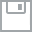
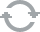
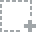
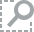
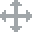
...
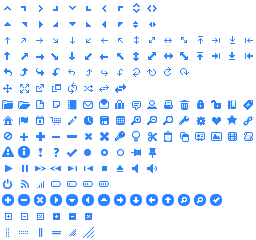
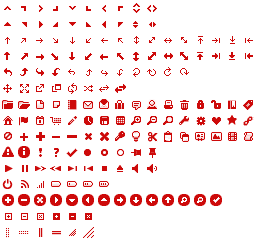
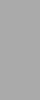
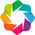
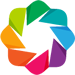

In [292]:
plotPCA(dpt1='REC', dpt2='FIR', xVar='PC1', yVar='PC2',legLoc='bottom_left')

## PC1 is the additive result of everything. 

In [293]:
def plotScatter(dpt1,dpt2,xVar,yVar,legLoc="bottom_left"):

    from bokeh.plotting import figure, output_file, show, ColumnDataSource, output_notebook
    from bokeh.models import HoverTool, Select

    output_notebook()
    
    nAll = df
    n1 = df[df['department_code']==dpt1]
    n2 = df[df['department_code']==dpt2]

    sAll = ColumnDataSource(
            data=dict(
                x = nAll[xVar],
                y = nAll[yVar],
                totSal = nAll['total_salary'],
                totCom = nAll['total_compensation'],
                dept = nAll['department'],
                totBen = nAll['total_benefits'],
                job = nAll['job']
            )
        )

    s1 = ColumnDataSource(
            data=dict(
                x = n1[xVar],
                y = n1[yVar],
                totSal = n1['total_salary'],
                totCom = n1['total_compensation'],
                dept = n1['department'],
                totBen = n1['total_benefits'],
                job = n1['job']
            )
        )

    s2 = ColumnDataSource(
            data=dict(
                x = n2[xVar],
                y = n2[yVar],
                totSal = n2['total_salary'],
                totCom = n2['total_compensation'],
                dept = n2['department'],
                totBen = n2['total_benefits'],
                job = n2['job']
            )
        )

    p = figure(plot_width=500, plot_height=400, tools="hover,pan,box_zoom,reset,save",
               title="SF public employee salaries", y_axis_label = yVar,
               x_axis_label = xVar)

    hover = p.select(dict(type=HoverTool))


    hover.tooltips = [
        ("Dept", "@dept"),
        ("Job", "@job"),
        ("Tot comp ($)", "@totCom"),
        ("Tot sal ($)", "@totSal"),
        ("Tot bnft ($)","@totBen")
    ]

    p.circle('x', 'y', size=5, legend="All", source=sAll,fill_color=None, line_color="black",alpha=0.3)
    p.circle('x', 'y', size=5, legend=dpt1, source=s1,color='darkcyan',alpha=0.6)
    p.circle('x', 'y', size=5, legend=dpt2, source=s2,color='red',alpha=0.6)

    p.legend.orientation = legLoc

    show(p)


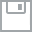
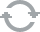
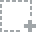
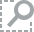
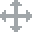
...
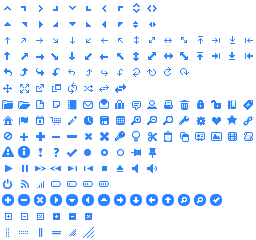
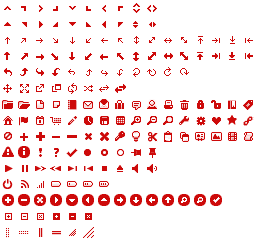
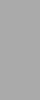
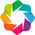
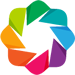

In [294]:
plotScatter('REC','FIR','total_compensation','retirement',legLoc='top_left')

## PC2 is negatively correlated with other_salaries and positively correlated with other_benefits. Because the Fire Department has a lower value for PC2, we expect lower "other_benefits" and higher "other_salaries"

In [295]:
1+1

2


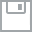
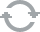
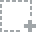
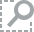
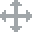
...
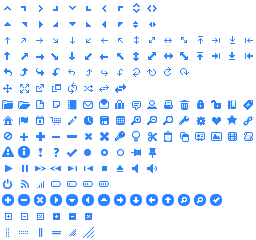
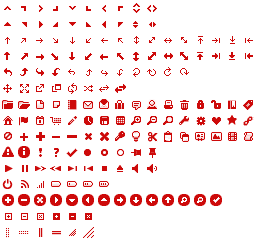
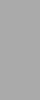
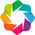
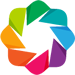

In [296]:
plotScatter('REC','FIR','other_benefits','other_salaries',legLoc='top_right')


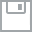
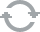
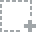
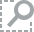
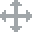
...
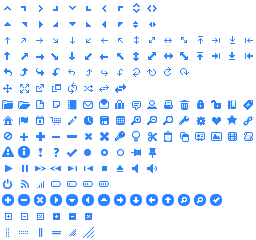
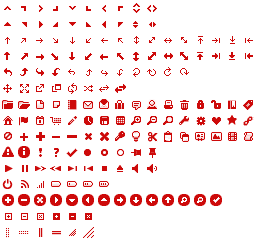
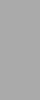
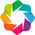
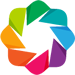

In [297]:
plotPCA(dpt1='FIR', dpt2='DPH', xVar='PC1', yVar='PC3')

## DPH is higher for PC3 and the Fire Dept is lower for PC3.
Based on the loadings for PC3, both overtime and 'health_dental' are negatively correlated with PC3. So we expect Dept. Public Health to have low overtime and health/dental. And vice versa for the Fire Department


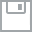
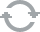
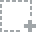
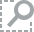
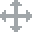
...
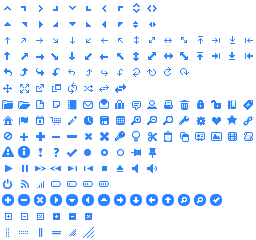
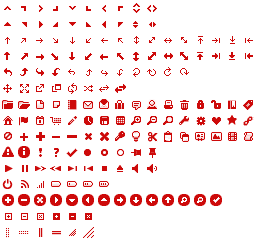
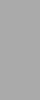
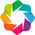
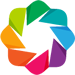

In [298]:
plotScatter('DPH','FIR','health_dental','overtime',legLoc='top_left')
#plotScatter('DPH','FIR','health_dental','other_salaries',legLoc='top_left')

In [ ]:
otOrder = [i for i in ob.sort_values(by='overtime',ascending=False).index.get_level_values(1)]
osOrder = [i for i in ob.sort_values(by='other_salaries',ascending=False).index.get_level_values(1)]

ob['fracOB']=ob['other_benefits']/ob['total_compensation']*100
ob['fracOT']=ob['overtime']/ob['total_compensation']*100

In [84]:
ob = df.groupby(['department','department_code']).mean()[['other_salaries','total_compensation','overtime']]


#ob[ob.sort_values(by='overtime',ascending=True).loc[:,'overtime']!=0]
otOrder = [i for i in ob.sort_values(by='overtime',ascending=False).index.get_level_values(1)]
osOrder = [i for i in ob.sort_values(by='other_salaries',ascending=False).index.get_level_values(1)]


The loadings show us that the SF fire department has a generally higher total compensation, with relatively less overtime and other salary.

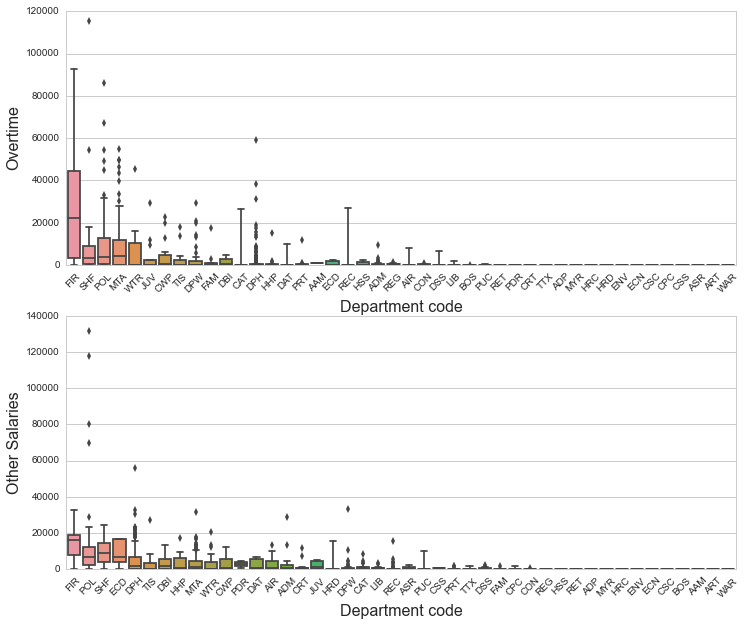

In [85]:
fig = plt.figure(figsize=(12,10), dpi=1600)
ax1 = plt.subplot2grid((2,1), (0,0))

sns.set_style("whitegrid")

#sns.boxplot(x = 'department_code',y='overtime',data=dfOT.sort_values(by='overtime'),order=otOrder)
sns.boxplot(x = 'department_code',y='overtime',data=df,order=otOrder)
labs = [i.get_text() for i in ax1.get_xticklabels()]
ax1.set_xticklabels(labs,rotation=45)
ax1.set_xlabel('Department code',fontsize=16)
ax1.set_ylabel('Overtime',fontsize=16)

ax2 = plt.subplot2grid((2,1), (1,0))
sns.boxplot(x = 'department_code',y='other_salaries',data=df,order=osOrder)
labs = [i.get_text() for i in ax2.get_xticklabels()]
ax2.set_xticklabels(labs,rotation=45)
ax2.set_xlabel('Department code',fontsize=16)
ax2.set_ylabel('Other Salaries',fontsize=16)

plt.show()
fig.tight_layout()

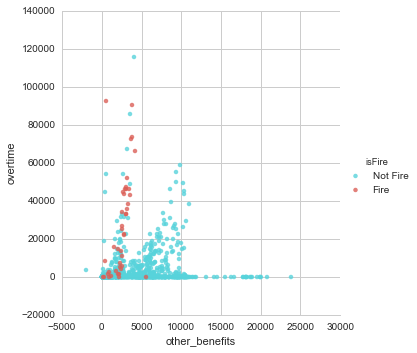

In [156]:
#sns.lmplot("x", "y", data=df, hue='dataset', fit_reg=False)
df['isFire']='Not Fire'

df.loc[df['department_code']=='FIR','isFire']='Fire'
df
#sns.lmplot("total_compensation", "overtime", data=df, hue='isFire',fit_reg=False,palette=sns.color_palette("hls", 2)[::-1])
sns.lmplot("other_benefits", "overtime", data=df, hue='isFire',fit_reg=False,palette=sns.color_palette("hls", 2)[::-1])


plt.show()

In [ ]:
df.head()

In [104]:
nAll = newData    
nPol = newData[newData['department_code']=='POL']
nDph = newData[newData['department_code']=='DPH']
nMta = newData[newData['department_code']=='MTA']


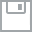
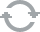
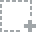
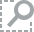
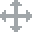
...
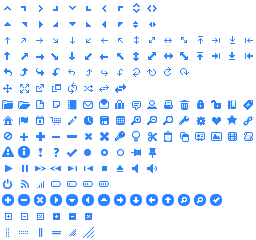
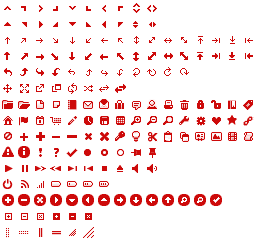
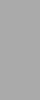
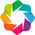
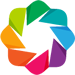

In [105]:
from bokeh.plotting import figure, output_file, show, ColumnDataSource, output_notebook
from bokeh.models import HoverTool, Select
#from bokeh.io import output_file, show, vform
#from bokeh.models.widgets import CheckboxGroup
#from bokeh.resources import CDN
#from bokeh.embed import file_html

output_notebook()

#output_file("salarySF.html")


sAll = ColumnDataSource(
        data=dict(
            x = nAll['PC1'],
            y = nAll['PC3'],
            totSal = nAll['total_salary'],
            hDen = nAll['health_dental'],
            totCom = nAll['total_compensation'],
            dept = nAll['department'],
            totBen = nAll['total_benefits'],
            job = nAll['job']
        )
    )

sPol = ColumnDataSource(
        data=dict(
            x = nPol['PC1'],
            y = nPol['PC3'],
            totSal = nPol['total_salary'],
            hDen = nPol['health_dental'],
            totCom = nPol['total_compensation'],
            dept = nPol['department'],
            totBen = nPol['total_benefits'],
            job = nPol['job']
        )
    )

sDph = ColumnDataSource(
        data=dict(
            x = nDph['PC1'],
            y = nDph['PC3'],
            totSal = nDph['total_salary'],
            hDen = nDph['health_dental'],
            totCom = nDph['total_compensation'],
            dept = nDph['department'],
            totBen = nDph['total_benefits'],
            job = nDph['job']
        )
    )

sMta = ColumnDataSource(
        data=dict(
            x = nMta['PC1'],
            y = nMta['PC3'],
            totSal = nMta['total_salary'],
            hDen = nMta['health_dental'],        
            totCom = nMta['total_compensation'],
            dept = nMta['department'],
            totBen = nMta['total_benefits'],
            job = nMta['job']
        )
    )

p = figure(plot_width=800, plot_height=500, tools="hover,pan,box_zoom,reset,save",
           title="SF public employee salaries", y_axis_label = "Principal Component 3",
           x_axis_label = "Principal Component 1")

hover = p.select(dict(type=HoverTool))


hover.tooltips = [
    ("Dept", "@dept"),
    ("Job", "@job"),
    ("Tot comp ($)", "@totCom"),
    ("Tot sal ($)", "@totSal"),
    ("Tot bnft ($)","@totBen"),
    ("HlthDntl ($):","@hDen")
]

p.circle('x', 'y', size=8, legend="All", source=sAll,fill_color=None, line_color="black",alpha=0.4)
p.circle('x', 'y', size=8, legend="MTA", source=sMta,color='blue',alpha=0.4)
p.circle('x', 'y', size=8, legend="SF Police", source=sPol,color='red',alpha=0.4)
p.circle('x', 'y', size=8, legend="Public Health", source=sDph,color='orange',alpha=0.4)

p.legend.orientation = "bottom_left"

#html = file_html(p, CDN, "my plot")

show(p)

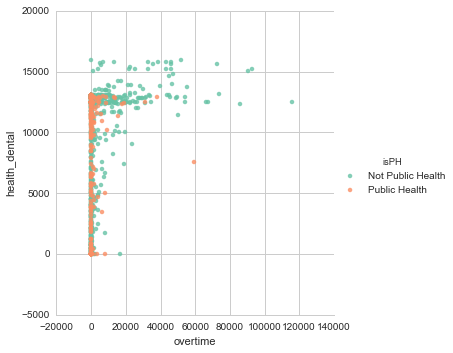

In [154]:
df['isPH']='Not Public Health'
df.loc[df['department_code']=='DPH','isPH']='Public Health'
df
sns.lmplot("overtime", "health_dental", data=df, hue='isPH',fit_reg=False,palette="Set2")

plt.show()

In [ ]:
df['isPH']='Not Public Health'
df.loc[df['department_code']=='DPH','isPH']='Public Health'
df
sns.lmplot("total_compensation", "health_dental", data=df, hue='isPH',fit_reg=False,palette="Set2")

plt.show()

,PC1,PC2,PC3,PC4,PC5,PC6,total_compensation,total_salary,department,total_benefits,job,department_code
0,-2.877892,-0.188047,-0.065495,0.299980,0.382646,-0.105336,27.68,27.68,Health Service System,0.00,Deputy Sheriff,HSS
1,-2.877263,-0.185791,-0.067287,0.300270,0.383507,-0.105389,48.18,37.36,Public Health,10.82,Special Nurse,DPH
2,-2.873023,-0.181642,-0.066632,0.307331,0.379291,-0.104287,116.80,76.00,Recreation and Park Commission,40.80,Swimming Instructor,REC
3,-2.874268,-0.197041,-0.054520,0.303752,0.378960,-0.105395,168.47,160.08,District Attorney,8.39,Attorney (Civil/Criminal),DAT
4,-2.872661,-0.200043,-0.051024,0.304208,0.377224,-0.105366,219.81,204.19,General Services Agency - City Admin,15.62,Public Service Trainee,ADM
5,-2.872425,-0.183027,-0.066666,0.303962,0.383733,-0.100906,323.70,300.00,Environment,23.70,"Bdcomm Mbr, Grp2,M=$25/Mtg",ENV
6,-2.865724,-0.182573,-0.067957,0.296693,0.380794,-0.105171,393.19,265.40,Public Health,127.79,Pharmacy Technician,DPH
7,-2.868320,-0.211586,-0.037340,0.308318,0.372794,-0.105426,394.81,370.33,Municipal Transportation Agency,24.48,Automotive Service Worker,MTA
8,-2.852074,-0.180183,-0.072063,0.277576,0.360010,-0.098255,589.56,354.96,Recreation and Park Commission,234.60,Public Service Trainee,REC
9,-2.852135,-0.179944,-0.071190,0.280531,0.361818,-0.097435,647.16,422.66,Human Services,224.50,Public Svc Aide-Public Works,DSS



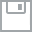
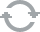
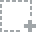
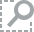
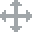
...
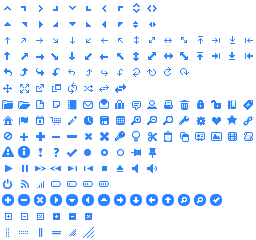
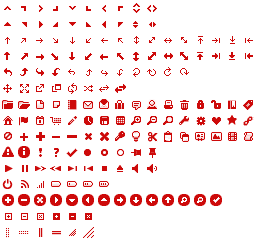
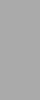
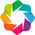
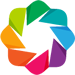

In [427]:
from bokeh.embed import components 

from bokeh.plotting import figure, output_file, show, ColumnDataSource, output_notebook
from bokeh.models import HoverTool, Select
#from bokeh.io import output_file, show, vform
#from bokeh.models.widgets import CheckboxGroup
#from bokeh.resources import CDN
#from bokeh.embed import file_html

output_notebook()

#output_file("salarySF.html")

checkbox_group = CheckboxGroup(
       labels=["Option 1", "Option 2", "Option 3"], active=[0, 1])


#Not creative enough. I think I could just make a new source for each dept...
sAll = ColumnDataSource(
        data=dict(
            x = nAll['PC1'],
            y = nAll['PC2'],
            totSal = nAll['total_salary'],
            totCom = nAll['total_compensation'],
            dept = nAll['department'],
            totBen = nAll['total_benefits'],
            job = nAll['job']
        )
    )

sPol = ColumnDataSource(
        data=dict(
            x = nPol['PC1'],
            y = nPol['PC2'],
            totSal = nPol['total_salary'],
            totCom = nPol['total_compensation'],
            dept = nPol['department'],
            totBen = nPol['total_benefits'],
            job = nPol['job']
        )
    )

sFir = ColumnDataSource(
        data=dict(
            x = nFir['PC1'],
            y = nFir['PC2'],
            totSal = nFir['total_salary'],
            totCom = nFir['total_compensation'],
            dept = nFir['department'],
            totBen = nFir['total_benefits'],
            job = nFir['job']
        )
    )

sMta = ColumnDataSource(
        data=dict(
            x = nMta['PC1'],
            y = nMta['PC2'],
            totSal = nMta['total_salary'],
            totCom = nMta['total_compensation'],
            dept = nMta['department'],
            totBen = nMta['total_benefits'],
            job = nMta['job']
        )
    )

p = figure(plot_width=800, plot_height=500, tools="hover,pan,box_zoom,reset,save",
           title="SF public employee salaries", y_axis_label = "Principal Component 2",
           x_axis_label = "Principal Component 1")

hover = p.select(dict(type=HoverTool))


hover.tooltips = [
    ("Dept", "@dept"),
    ("Job", "@job"),
    ("Tot comp ($)", "@totCom"),
    ("Tot sal ($)", "@totSal"),
    ("Tot bnft ($)","@totBen")
]

p.circle('x', 'y', size=8, legend="All", source=sAll,fill_color=None, line_color="black",alpha=0.4)
p.circle('x', 'y', size=8, legend="MTA", source=sMta,color='blue',alpha=0.4)
p.circle('x', 'y', size=8, legend="SF Police", source=sPol,color='red',alpha=0.4)
p.circle('x', 'y', size=8, legend="SF Fire", source=sFir,color='orange',alpha=0.4)

p.legend.orientation = "bottom_left"

#html = file_html(p, CDN, "my plot")

show(p)

#script, div = components(p)
#render_template('graph.html', script=script, div=div)


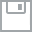
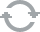
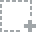
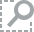
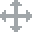
...
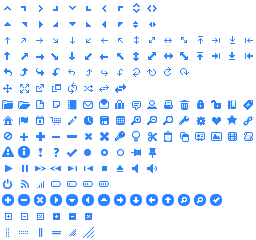
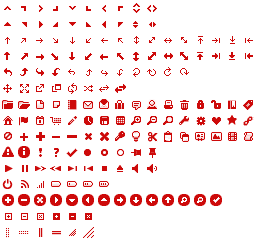
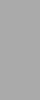
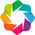
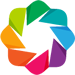

In [161]:
from bokeh.plotting import figure, output_file, show, ColumnDataSource, output_notebook
from bokeh.models import HoverTool, Select

output_notebook()

sAll = ColumnDataSource(
        data=dict(
            x = df.index,
            y = df['total_compensation'],
            totSal = df['total_salary'],
            dept = df['department'],
            totBen = df['total_benefits'],
            job = df['job']
        )
    )

sPol = ColumnDataSource(
        data=dict(
            x = dfPol.index,
            y = dfPol['total_compensation'],
            totSal = dfPol['total_salary'],
            dept = dfPol['department'],
            totBen = dfPol['total_benefits'],
            job = dfPol['job']
        )
    )

sFir = ColumnDataSource(
        data=dict(
            x = dfFir.index,
            y = dfFir['total_compensation'],
            totSal = dfFir['total_salary'],
            dept = dfFir['department'],
            totBen = dfFir['total_benefits'],
            job = dfFir['job']
        )
    )

sMta = ColumnDataSource(
        data=dict(
            x = dfMta.index,
            y = dfMta['total_compensation'],
            totSal = dfMta['total_salary'],
            dept = dfMta['department'],
            totBen = dfMta['total_benefits'],
            job = dfMta['job']
        )
    )

p = figure(plot_width=800, plot_height=500, tools="hover,pan,box_zoom,reset,save",
           title="SF public employee salaries", y_axis_label = "Total compensation",
           x_axis_label = "Sorted employee index")

hover = p.select(dict(type=HoverTool))


hover.tooltips = [
    ("Dept", "@dept"),
    ("Job", "@job"),
    ("Tot comp ($)", "@y"),
    ("Tot sal ($)", "@totSal"),
    ("Tot bnft ($)","@totBen")
]

p.circle('x', 'y', size=8, legend="All", source=sAll,fill_color=None, line_color="black",alpha=0.2)
p.circle('x', 'y', size=8, legend="MTA", source=sMta,color='blue',alpha=0.4)
p.circle('x', 'y', size=8, legend="SF Police", source=sPol,color='red',alpha=0.4)
p.circle('x', 'y', size=8, legend="SF Fire", source=sFir,color='orange',alpha=0.4)

p.legend.orientation = "top_left"

show(p)